# Prepare Clean (Glass + Gunshot) / 准备清理版（玻璃+枪声）

- 基于 `prepare.ipynb` 复制整理：去重 config/helper、按阶段分组，保持主逻辑不变。
- 下一步会逐步把关键步骤 API 化到 `src/`，供 infer 在线复用。


## Imports / 导入

In [1]:
import wave
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import librosa
import re
from IPython.display import Audio, display
from src.meta_utils import load_meta_files, map_canonical_labels, deduplicate_meta, sample_gunshot_even, stratified_folds
from src.viz import plot_wave_and_mel
from src.cache_utils import build_cache_index, GLASS_PIPELINE_PLAN
from src.datasets import balance_folds
from src.augment_pipeline import run_pipeline, PIPELINE_REGISTRY
from src.data_utils import load_audio, generate_aligned_windows, trim_silence, log_mel_spectrogram
from src.prepare_pipeline import cache_windows_to_mel_index, filter_and_sample_gunshot, load_and_split_meta
from src.config import TARGET_LABELS, POSITIVE_LABELS, SEED, SR, PROJECT_ROOT, N_MELS, HOP_LENGTH, BACKGROUND_LABEL, CACHE_ROOT, CACHE_MEL64, META_FILES, RAW_AUDIO_ROOTS, LABEL_TO_ID, NUM_CLASSES, MEL_CENTER, MEL_TARGET_FRAMES, WINDOW_PARAMS, DEVICE_PLANS, WINDOW_HOP_OVERRIDE
from src.augment_device import run_device_pipeline
from src.folds import rebalance_folds_by_windows

import src.data_utils as du



## Config / 配置（集中）


In [2]:
# Config (single source of truth)
# Keep all run parameters here. 统一把本次运行参数放在这里。

META_FILES = META_FILES  # from config
LABEL_MAP = POSITIVE_LABELS
K_FOLDS = 5
TARGET_PER_FOLD = {'glass': 300, 'gunshot': 300}
TARGET_BG_PER_FOLD = 500

MAX_DURATION = 6.0  # seconds
GUNSHOT_TARGET = 270  # total gunshot clips after sampling
TARGET_SR = SR
RESAMPLED_ROOT = CACHE_ROOT / 'data_resampled'
INCLUDE_SOURCES = ['esc50', 'gunshot_kaggle', 'sound_extra', 'background_catergorized']
TARGET_FRAMES = MEL_TARGET_FRAMES

REBALANCE_GLASS = True  # set False to skip
REBALANCE_TOL_RATIO = 0.05

# Windowing / energy thresholds (used by windowing + QA)
WINDOW_SECONDS = 1.0
WINDOW_HOP = 0.5
ENERGY_THRESHOLD = 0.3
PEAK_RATIO_THRESHOLD = 0.8
FRONT_PEAK_RATIO = 0.5
EXTRA_SHIFTS = (-0.1, 0.1)
TRIM_SILENCE_BEFORE = True
TRIM_TOP_DB = 20.0
TRIM_MIN_KEEP_SECONDS = 0.2
cfg_rows = [
    ('WINDOW_SECONDS', WINDOW_SECONDS, 'window length (s): longer=more context, shorter=less latency but may miss long events'),
    ('WINDOW_HOP', WINDOW_HOP, 'hop (s): smaller=denser windows, larger=fewer windows/less overlap'),
    ('ENERGY_THRESHOLD', ENERGY_THRESHOLD, 'energy mask threshold (relative): higher=drop quiet windows, lower=keep more'),
    ('PEAK_RATIO_THRESHOLD', PEAK_RATIO_THRESHOLD, 'peak energy ratio (relative to clip): higher=only strong peaks kept'),
    ('FRONT_PEAK_RATIO', FRONT_PEAK_RATIO, 'peak position limit (0-1): lower=peaks must be earlier'),
    ('EXTRA_SHIFTS', EXTRA_SHIFTS, 'fallback shifts (s) when no peak windows kept'),
    ('TRIM_SILENCE_BEFORE', TRIM_SILENCE_BEFORE, 'apply silence trim before windowing'),
    ('TRIM_TOP_DB', TRIM_TOP_DB, 'trim threshold dB: higher=more aggressive trimming'),
    ('TRIM_MIN_KEEP_SECONDS', TRIM_MIN_KEEP_SECONDS, 'min segment kept after trim (s)')
]
print('Windowing / energy config:')
for k,v,desc in cfg_rows:
    print(f'- {k}: {v} -> {desc}')


Windowing / energy config:
- WINDOW_SECONDS: 1.0 -> window length (s): longer=more context, shorter=less latency but may miss long events
- WINDOW_HOP: 0.5 -> hop (s): smaller=denser windows, larger=fewer windows/less overlap
- ENERGY_THRESHOLD: 0.3 -> energy mask threshold (relative): higher=drop quiet windows, lower=keep more
- PEAK_RATIO_THRESHOLD: 0.8 -> peak energy ratio (relative to clip): higher=only strong peaks kept
- FRONT_PEAK_RATIO: 0.5 -> peak position limit (0-1): lower=peaks must be earlier
- EXTRA_SHIFTS: (-0.1, 0.1) -> fallback shifts (s) when no peak windows kept
- TRIM_SILENCE_BEFORE: True -> apply silence trim before windowing
- TRIM_TOP_DB: 20.0 -> trim threshold dB: higher=more aggressive trimming
- TRIM_MIN_KEEP_SECONDS: 0.2 -> min segment kept after trim (s)


## Helpers / 辅助函数（集中）


In [3]:
# Helpers (shared across cells)
# 只放“纯 helper”，不依赖临时变量（例如 bg_pool/rng 这种仍留在原 cell 内）。

from typing import Any


def parse_weapon(extra: str) -> str:
    """Parse weapon_id=XXX from extra_meta string."""
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"


def _quantile95(x):
    return x.quantile(0.95)


def compute_energy_detail(sub_df: pd.DataFrame, sample_n: int = 80) -> pd.DataFrame:
    """Sample clips and compute duration/RMS peak/peak position/active ratio."""
    rows: list[dict[str, Any]] = []
    if len(sub_df) == 0:
        return pd.DataFrame(rows)
    sample = sub_df.sample(n=min(sample_n, len(sub_df)), random_state=SEED)
    for _, r in sample.iterrows():
        y, sr = load_audio(r, sr=TARGET_SR)
        if TRIM_SILENCE_BEFORE:
            y = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
        frame_length = min(2048, int(WINDOW_SECONDS * sr))
        hop = int(WINDOW_HOP * sr)
        rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop)[0]
        if rms.size == 0 or rms.max() <= 0:
            continue
        peak_idx = int(np.argmax(rms))
        peak_pos = peak_idx / max(len(rms) - 1, 1)
        active_ratio = float((rms > (rms.max() * ENERGY_THRESHOLD)).sum()) / len(rms)
        rows.append({
            'duration': len(y) / sr,
            'rms_max': float(rms.max()),
            'peak_pos': peak_pos,
            'active_ratio': active_ratio,
        })
    return pd.DataFrame(rows)


def resolve_audio_from_row(row: dict | pd.Series, sr: int = TARGET_SR):
    """Return (y, sr) using in-row audio if present, else load_audio(row)."""
    audio = None
    if isinstance(row, dict):
        audio = row.get('audio')
    else:
        audio = row.get('audio') if 'audio' in row else None
    if audio is not None:
        return audio, sr
    return load_audio(row, sr=sr)


## Load, map, dedup / 读取映射去重
- Load meta CSVs
- Map raw labels to canonical labels
- Deduplicate by md5/filepath
- Summary counts

读取 meta，映射标签，按 md5/路径去重，打印汇总。

In [4]:
meta_df, working_df, holdout_df = load_and_split_meta(
    META_FILES,
    label_map=LABEL_MAP,
    target_labels=TARGET_LABELS,
    include_sources=INCLUDE_SOURCES,
    dedup_subset=['md5', 'filepath'],
)
print('Total rows after dedup:', len(meta_df))
print('By source (all):', meta_df['source'].value_counts().to_dict(), '\n')
print('Working sources:', INCLUDE_SOURCES, '->', working_df['source'].value_counts().to_dict())
print('Working labels:', working_df['canonical_label'].value_counts().to_dict())
print('Holdout sources:', holdout_df['source'].value_counts().to_dict())
print('Holdout labels:', holdout_df['canonical_label'].value_counts().to_dict())


Total rows after dedup: 3094
By source (all): {'esc50': 2000, 'gunshot_kaggle': 851, 'sound_extra': 133, 'background_catergorized': 91, 'freesound': 19} 

Working sources: ['esc50', 'gunshot_kaggle', 'sound_extra', 'background_catergorized'] -> {'esc50': 2000, 'gunshot_kaggle': 851, 'sound_extra': 133, 'background_catergorized': 91}
Working labels: {'gunshot': 851, 'glass': 128, 'dog': 40, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'hen': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'car_horn': 40, 'chainsaw': 40, 'airplane': 40, 'mous

## Filter & gunshot sampling / 过滤与枪声抽样
- Drop clips longer than MAX_DURATION
- Evenly sample gunshot across weapon_id to total GUNSHOT_TARGET

过滤 >MAX_DURATION；枪声按 weapon_id 均匀抽样，总数 GUNSHOT_TARGET。

In [5]:
clean_df, gun_debug = filter_and_sample_gunshot(
    working_df,
    max_duration_sec=MAX_DURATION,
    gunshot_total=GUNSHOT_TARGET,
    seed=SEED,
)
if gun_debug.get('gunshot_sampled_rows', 0) > 0:
    print('Gunshot sampled per source:', gun_debug.get('gunshot_sampled_by_source', {}))
    print('Gunshot sampled per weapon_id (from parent folder):', gun_debug.get('gunshot_sampled_by_weapon_folder', {}), '\n')
print(f"Label counts: ({gun_debug.get('final_rows', len(clean_df))})", gun_debug.get('final_label_counts', {}))



Gunshot sampled per source: {'gunshot_kaggle': 270}
Gunshot sampled per weapon_id (from parent folder): {'AK-12': 30, 'AK-47': 30, 'IMI Desert Eagle': 30, 'M16': 30, 'M249': 30, 'M4': 30, 'MG-42': 30, 'MP5': 30, 'Zastava M92': 30} 

Label counts: (2471) {'gunshot': 270, 'glass': 115, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'car_horn': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'clapping': 40, 'train': 40, 'footsteps': 40, 'sheep': 40, 'brushing_teeth': 40, 'cow': 40, '

## Resample to 22.05k mono / 重采样为22.05k单声道
Write resampled audio to cache/data_resampled and build resampled_df. 将重采样音频写到 cache/data_resampled，并生成 resampled_df。
⚠️ Loads & writes all clips; may take time/disk. 需加载并写出全部音频，耗时且占用磁盘。

In [6]:
resampled_rows = []
for _, r in clean_df.iterrows():
    y_rs, sr_rs = load_audio(r, sr=TARGET_SR)
    rel = Path(r['filepath'])
    if rel.is_absolute():
        rel = rel.relative_to(PROJECT_ROOT)
    dst_path = RESAMPLED_ROOT / rel
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    y_int16 = (y_rs * 32767).clip(-32768, 32767).astype('int16')
    with wave.open(dst_path.as_posix(), 'wb') as wf:
        wf.setnchannels(1)
        wf.setsampwidth(2)
        wf.setframerate(TARGET_SR)
        wf.writeframes(y_int16.tobytes())
    frames = len(y_int16)
    resampled_rows.append({
        'sno': r.get('sno', len(resampled_rows)+1),
        'raw_filepath': rel.as_posix(),
        'filepath': dst_path.relative_to(PROJECT_ROOT).as_posix(),
        'label': r.get('label'),
        'canonical_label': r.get('canonical_label'),
        'source': r.get('source'),
        'fold_id': r.get('fold_id',''),
        'duration_sec': round(frames / TARGET_SR, 3),
        'duration_samples': frames,
        'sr': TARGET_SR,
        'channels': 1,
        'bit_depth': 16,
        'md5': '',
        'extra_meta': r.get('extra_meta',''),
    })
resampled_df = pd.DataFrame(resampled_rows)
resampled_df['target_label'] = resampled_df['canonical_label']
print('Resampled rows:', len(resampled_df))
print('sr/ch after resample:', resampled_df['sr'].unique(), resampled_df['channels'].unique())
print('Label counts:', resampled_df['target_label'].value_counts().to_dict())


Resampled rows: 2471
sr/ch after resample: [21333] [1]
Label counts: {'gunshot': 270, 'glass': 115, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'chirping_birds': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'crackling_fire': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'car_horn': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'clapping': 40, 'train': 40, 'footsteps': 40, 'sheep': 40, 'brushing_teeth': 40, 'cow': 40, 'frog': 40, 'hen': 40, 'wind': 40, 'keyboard_typing': 40, 'clock_alarm': 40, 'church_bells': 40, 'water_drops': 40, 'talking': 34, 'screaming': 18, 'coin': 18, 'silent': 17, 'music': 16,

In [7]:
# Optional: save holdout meta for later use
if len(holdout_df) > 0:
    holdout_path = RESAMPLED_ROOT / 'holdout_meta.csv'
    holdout_path.parent.mkdir(parents=True, exist_ok=True)
    holdout_df.to_csv(holdout_path, index=False)
    print('Saved holdout meta to', holdout_path)


Saved holdout meta to /workspace/cache/data_resampled/holdout_meta.csv


## Listen: before vs after / 试听前后
Play original vs resampled audio for a few samples. 对比播放原始与重采样音频。

In [8]:
samples = resampled_df.sample(n=min(5, len(resampled_df)), random_state=SEED)
for _, r in samples.iterrows():
    y_after, sr_after = load_audio(r, sr=TARGET_SR)
    raw_rel = Path(r.get('raw_filepath', r['filepath']))
    raw_path = PROJECT_ROOT / raw_rel if not raw_rel.is_absolute() else raw_rel
    y_before, sr_before = (None, None)
    if raw_path.exists():
        y_before, sr_before = load_audio({'filepath': raw_path}, sr=None)
    print('Sample:', r.get('target_label',''), '|', raw_rel)
    if y_before is not None:
        display(Audio(y_before, rate=sr_before))
    display(Audio(y_after, rate=sr_after))
    print('-'*40)


Sample: crackling_fire | data/esc50/audio/3-158476-A-12.wav


----------------------------------------
Sample: talking | data/background_catergorized/talking_background/talking_on_pcm_sample_retraining_35.wav


----------------------------------------
Sample: cow | data/esc50/audio/5-194899-C-3.wav


----------------------------------------
Sample: water_drops | data/esc50/audio/4-212604-B-15.wav


----------------------------------------
Sample: pouring_water | data/esc50/audio/1-79220-A-17.wav


----------------------------------------


## 给 Audio 进行分折
- 在audio层进行分折，可以避免同一个audio切窗之后混入不同的 fold


In [9]:
folded_df = stratified_folds(resampled_df, k=K_FOLDS, seed=SEED, group_key='canonical_label', sub_key='weapon_id', fold_column='fold_id')
print('Fold distribution (counts):', folded_df['fold_id'].value_counts().to_dict())
fold_pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
print('Label x fold (counts):')
display(fold_pivot)

# 从 extra_meta 中提取 weapon_id=XXXX 的值
gun_df = folded_df[folded_df['canonical_label'] == 'gunshot'].copy()
gun_df["weapon"] = gun_df["extra_meta"].apply(parse_weapon)
weapon_fold = gun_df.pivot_table(
    index="weapon",
    columns="fold_id",
    values="filepath",
    aggfunc="count",
    fill_value=0
).astype(int)
print("\nWeapon x fold (counts):")
display(weapon_fold)


Fold distribution (counts): {1: 500, 2: 496, 3: 494, 4: 491, 5: 490}
Label x fold (counts):


fold_id,1,2,3,4,5
target_label,,,,,
airplane,8,8,8,8,8
breathing,8,8,8,8,8
brushing_teeth,8,8,8,8,8
can_opening,8,8,8,8,8
car_horn,8,8,8,8,8
...,...,...,...,...,...
train,8,8,8,8,8
vacuum_cleaner,8,8,8,8,8
washing_machine,8,8,8,8,8



Weapon x fold (counts):


fold_id,1,2,3,4,5
weapon,,,,,
AK-12,6,6,6,6,6
AK-47,6,6,6,6,6
IMI Desert Eagle,6,6,6,6,6
M16,6,6,6,6,6
M249,6,6,6,6,6
M4,6,6,6,6,6
MG-42,6,6,6,6,6
MP5,6,6,6,6,6
Zastava M92,6,6,6,6,6


### Detailed energy/peak stats / 能量与峰值细查 (统计峰值位置、活跃占比，辅助判断窗口/裁剪参数)。

Energy detail (mean/median/95%)


duration                         rms_max                        \
             mean    median _quantile95      mean    median _quantile95   
label                                                                     
glass    0.958586  0.600009    3.463887  0.157263  0.123504    0.423180   
gunshot  1.447107  1.428022    2.000000  0.208913  0.193683    0.394372   

         peak_pos                    active_ratio                     
             mean median _quantile95         mean median _quantile95  
label                                                                 
glass    0.236250    0.0         1.0     0.797665    1.0         1.0  
gunshot  0.511458    0.5         1.0     0.780833    0.8         1.0

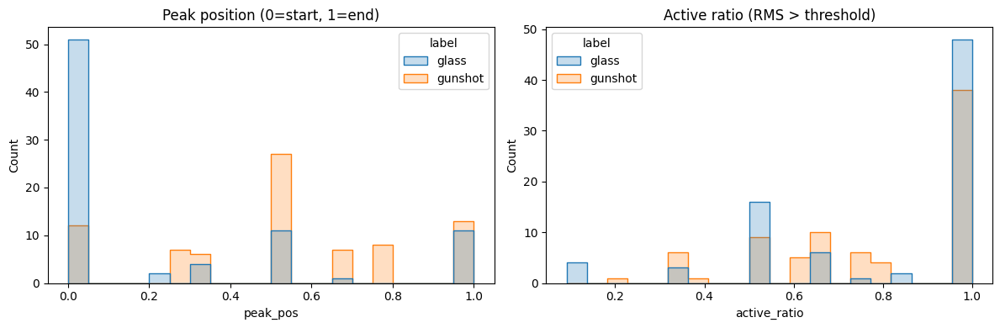

In [10]:
# Detailed energy/peak stats (uses global config values)

energy_detail = []
for lbl in ['glass', 'gunshot']:
    df_lbl = folded_df[folded_df['target_label'] == lbl]
    stats = compute_energy_detail(df_lbl)
    stats['label'] = lbl
    energy_detail.append(stats)
energy_detail = pd.concat(energy_detail, ignore_index=True)
print('Energy detail (mean/median/95%)')
display(energy_detail.groupby('label')[['duration', 'rms_max', 'peak_pos', 'active_ratio']].agg(['mean', 'median', _quantile95]))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(data=energy_detail, x='peak_pos', hue='label', bins=20, ax=axes[0], element='step')
axes[0].set_title('Peak position (0=start, 1=end)')
sns.histplot(data=energy_detail, x='active_ratio', hue='label', bins=20, ax=axes[1], element='step')
axes[1].set_title('Active ratio (RMS > threshold)')
plt.tight_layout(); plt.show()


## Base window summary / 基础分窗统计
Generate aligned windows for glass & gunshot, count per clip. 对玻璃/枪声分窗，统计每clip窗口数。

In [11]:
# Build ALL_WINS once (all labels) with unified params
from pathlib import Path

ALL_WINS = [] if 'ALL_WINS' not in globals() else ALL_WINS

def ensure_all_wins():
    """Cut once for all clips; cache windows with hop_used and metadata."""
    global ALL_WINS
    if ALL_WINS:
        return
    if 'folded_df' not in globals():
        print('folded_df not found; skip window build')
        return
    records = []
    for _, row in folded_df.iterrows():
        label = row['canonical_label']
        mapped = label if label in TARGET_LABELS else BACKGROUND_LABEL
        hop_override = WINDOW_HOP_OVERRIDE.get(label, WINDOW_HOP_OVERRIDE.get(mapped))
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
            window_hop=hop_override,
        )
        weapon = parse_weapon(row.get("extra_meta", "")) if mapped == "gunshot" else None
        clip_id = Path(row["filepath"]).stem
        hop_used = hop_override if hop_override is not None else WINDOW_HOP
        for w_idx, w in enumerate(wins):
            rec = {
                'clip_id': clip_id,
                'fold_id': int(row.get('fold_id', -1)),
                'target_label': mapped,
                'orig_label': label,
                'window_id': f"w{w_idx}",
                'hop_used': hop_used,
                'audio': w,
                'row': row,
            }
            if weapon is not None:
                rec['weapon'] = weapon
            records.append(rec)
    ALL_WINS = records

def get_cached_windows(row):
    """Return cached windows for this row (audio, id, hop, full rec)."""
    ensure_all_wins()
    if not ALL_WINS:
        return []
    clip_id = Path(row['filepath']).stem
    fold_id = int(row.get('fold_id', -1))
    mapped = row.get('canonical_label', row.get('target_label', BACKGROUND_LABEL))
    mapped = mapped if mapped in TARGET_LABELS else BACKGROUND_LABEL
    out = []
    for rec in ALL_WINS:
        if rec['clip_id']==clip_id and rec['fold_id']==fold_id and rec['target_label']==mapped:
            out.append((rec['audio'], rec['window_id'], rec.get('hop_used', WINDOW_HOP), rec))
    return out

def summarize_all_wins():
    if not ALL_WINS:
        print('No windows built')
        return
    df_all = pd.DataFrame([{k:v for k,v in rec.items() if k not in ('audio','row')} for rec in ALL_WINS])
    print('Windows per label (all):')
    print(df_all.groupby('target_label').size())
    print('Windows per fold x label:')
    print(df_all.pivot_table(index='fold_id', columns='target_label', values='window_id', aggfunc='count').fillna(0).astype(int))

ensure_all_wins()
summarize_all_wins()



Windows per label (all):
target_label
background    9772
glass          173
gunshot        457
dtype: int64
Windows per fold x label:
target_label  background  glass  gunshot
fold_id                                 
1                   1951     30       87
2                   1947     28       88
3                   1882     61      102
4                   1978     28       92
5                   2014     26       88


## Window QA visualization / 分窗可视化QA
Plot waveform+RMS with kept window boundaries for one glass and one gunshot sample. 对玻璃/枪声各选一条，画波形+RMS并标出保留的窗口边界。


=== Sample 1: glass | esc50 | cache/data_resampled/data/esc50/audio/1-88807-A-39.wav
Full clip (5.00s)


Length raw=5.00s after_trim=0.77s


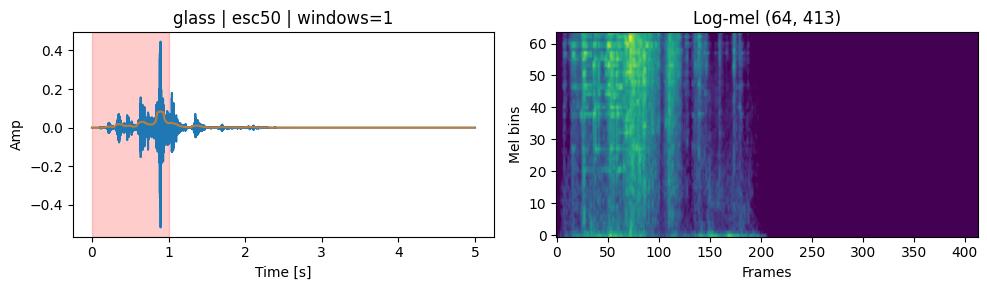

Play window 0: 0.00s - 1.00s


=== Sample 2: gunshot | gunshot_kaggle | cache/data_resampled/data/gunshot_kaggle/AK-47/1 (63).wav
Full clip (2.00s)


Length raw=2.00s after_trim=1.42s


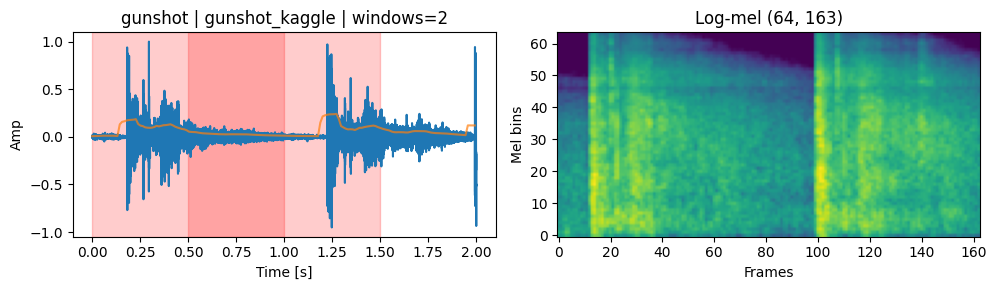

Play window 0: 0.00s - 1.00s


Play window 1: 0.50s - 1.50s


=== Sample 3: drinking_sipping | esc50 | cache/data_resampled/data/esc50/audio/5-207836-D-29.wav
Full clip (5.00s)


Length raw=5.00s after_trim=1.82s


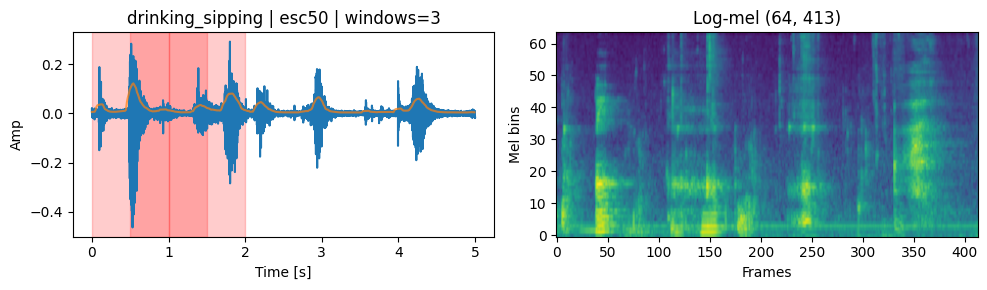

Play window 0: 0.00s - 1.00s


Play window 1: 0.50s - 1.50s


Play window 2: 1.00s - 2.00s


In [12]:
# Window QA (combined viz + listening) 基于 ALL_WINS（保留原可视化）
samples_cfg = ['glass','gunshot', BACKGROUND_LABEL]
samples = []
ensure_all_wins()
for lbl in samples_cfg:
    subset = folded_df[folded_df['target_label']==lbl]
    if len(subset) == 0:
        continue
    samples.append(subset.sample(random_state=SEED).iloc[0])
if not any(s.get('target_label') == BACKGROUND_LABEL for s in samples):
    bg_pool = folded_df[~folded_df['target_label'].isin(['glass','gunshot'])]
    if len(bg_pool) > 0:
        samples.append(bg_pool.sample(random_state=SEED).iloc[0])
if len(samples) == 0:
    print('No samples available for QA')
else:
    for idx, row in enumerate(samples):
        print(f"=== Sample {idx+1}: {row.get('target_label','')} | {row.get('source','')} | {row.get('filepath','')}")
        y, sr = load_audio(row, sr=TARGET_SR)
        print(f"Full clip ({len(y)/sr:.2f}s)")
        display(Audio(y, rate=sr))
        win_info = get_cached_windows(row)
        wins = [w for w, wid, hop, rec in win_info]
        hop_used = win_info[0][2] if win_info else WINDOW_HOP
        kept_starts = [i * hop_used for i in range(len(wins))]
        # 记录窗口决策日志无法直接复用，这里用窗口索引估计起点
        if TRIM_SILENCE_BEFORE:
            y_trim = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
            print(f"Length raw={len(y)/sr:.2f}s after_trim={len(y_trim)/sr:.2f}s")
        hop_len = int(WINDOW_HOP * sr)
        fig, axes = plt.subplots(1, 2, figsize=(10, 3))
        times = np.arange(len(y)) / sr
        axes[0].plot(times, y)
        axes[0].set_title(f"{row['target_label']} | {row['source']} | windows={len(wins)}")
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Amp')
        rms = librosa.feature.rms(y=y, frame_length=2048, hop_length=256)[0]
        rms_times = (np.arange(len(rms)) * 256) / sr
        axes[0].plot(rms_times, rms, alpha=0.7)
        for start_sec in kept_starts:
            axes[0].axvspan(start_sec, start_sec + WINDOW_SECONDS, color='red', alpha=0.2)
        mel = log_mel_spectrogram(y, sr, n_fft=HOP_LENGTH*4, hop_length=HOP_LENGTH, n_mels=N_MELS)
        axes[1].imshow(mel, aspect='auto', origin='lower')
        axes[1].set_title(f'Log-mel {mel.shape}')
        axes[1].set_xlabel('Frames')
        axes[1].set_ylabel('Mel bins')
        plt.tight_layout(); plt.show()
        for w_idx, w in enumerate(wins):
            start = kept_starts[w_idx] if w_idx < len(kept_starts) else w_idx * hop_len / sr
            end = start + WINDOW_SECONDS
            print(f"Play window {w_idx}: {start:.2f}s - {end:.2f}s")
            display(Audio(w, rate=sr))



## Play 10 event windows / 播放10个事件窗口
Play up to 10 kept windows (glass/gunshot) for quick QA. 播放最多10个保留窗口，便于快速听检。


In [13]:
# Play up to 10 target windows (glass/gun) 保留原试听流程
ensure_all_wins()
played = 0
if not ALL_WINS:
    print('No windows to play')
else:
    rng = np.random.default_rng(SEED)
    pool = [r for r in ALL_WINS if r['target_label'] in TARGET_LABELS]
    rng.shuffle(pool)
    for rec in pool:
        lbl = rec['target_label']
        clip_id = rec['clip_id']
        w = rec['audio']
        print(f"{lbl} | {clip_id} | window {rec['window_id']}")
        display(Audio(w, rate=TARGET_SR))
        played += 1
        if played >= 10:
            break
    if played == 0:
        print('No windows to play')
    else:
        mel = log_mel_spectrogram(pool[0]['audio'], sr=TARGET_SR)
        print(f'log-mel shape: {mel.shape}; model input: (batch, 1, {mel.shape[0]}, {mel.shape[1]})')



glass | 4-204777-B-39 | window w5


gunshot | 9 (18) | window w0


glass | 4-204777-A-39 | window w2


gunshot | 7 (44) | window w0


glass | glass_shatter-263962 | window w0


glass | glass_break-305771 | window w1


gunshot | 7 (2) | window w0


gunshot | 4 (39) | window w1


gunshot | 6 (45) | window w0


gunshot | 1 (20) | window w0


log-mel shape: (64, 80); model input: (batch, 1, 64, 80)


## 整合原始window数据

In [14]:
# Build window-level dataframe (one row per window) from ALL_WINS
ensure_all_wins()
if not ALL_WINS:
    print('No windows built')
else:
    rows = []
    for rec in ALL_WINS:
        hop_used = rec.get('hop_used', WINDOW_HOP)
        w_idx = int(rec['window_id'].lstrip('w'))
        start_sec = w_idx * hop_used
        rows.append({
            'clip_id': rec['clip_id'],
            'window_id': rec['window_id'],
            'fold_id': rec['fold_id'],
            'source': rec['row'].get('source',''),
            'orig_label': rec.get('orig_label', rec['target_label']),
            'target_label': rec['target_label'] if rec['target_label'] in TARGET_LABELS else BACKGROUND_LABEL,
            'start_sec': start_sec,
            'end_sec': start_sec + WINDOW_SECONDS,
            'length_sec': len(rec['audio'])/TARGET_SR,
            'filepath': rec['row'].get('filepath'),
            'raw_filepath': rec['row'].get('raw_filepath'),
        })
    window_df = pd.DataFrame(rows)
    print(f"Total windows: {len(window_df)}")
    label_totals = window_df['target_label'].value_counts().to_dict()
    print("Windows per label (total):")
    for k, v in label_totals.items():
        print(f"  {k}: {v}")
    if 'fold_id' in window_df.columns:
        print("Fold x label (total windows):")
        pivot = window_df.pivot_table(index='fold_id', columns='target_label', values='window_id', aggfunc='count').fillna(0)
        print(pivot.to_string())
    display(window_df[:5])



Total windows: 10402
Windows per label (total):
  background: 9772
  gunshot: 457
  glass: 173
Fold x label (total windows):
target_label  background  glass  gunshot
fold_id                                 
1                   1951     30       87
2                   1947     28       88
3                   1882     61      102
4                   1978     28       92
5                   2014     26       88


,clip_id,window_id,fold_id,source,orig_label,target_label,start_sec,end_sec,length_sec,filepath,raw_filepath
0,5-215445-A-47,w0,1,esc50,airplane,background,0.0,1.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
1,5-215445-A-47,w1,1,esc50,airplane,background,0.5,1.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
2,5-215445-A-47,w2,1,esc50,airplane,background,1.0,2.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
3,5-215445-A-47,w3,1,esc50,airplane,background,1.5,2.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
4,5-215445-A-47,w4,1,esc50,airplane,background,2.0,3.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav


## Augment plan & cache dirs / 增强计划与缓存目录
设定 pipeline、对齐标签、Smoke/Full 输出目录。

In [15]:
# ALIGN_LABELS = CACHE_ALIGN_LABELS
SMOKE_CACHE_DIR = CACHE_MEL64 / 'mel64_smoke_multi'
FULL_CACHE_DIR = CACHE_MEL64 / 'mel64_multi'
SMOKE_COUNTS = {'glass': 10, 'gunshot': 10, 'background': 20}
print('Smoke dir:', SMOKE_CACHE_DIR)
print('Full dir:', FULL_CACHE_DIR)


Smoke dir: /workspace/cache/mel64/mel64_smoke_multi
Full dir: /workspace/cache/mel64/mel64_multi


## 选出 target window，并使用数据增强扩充

In [16]:
import re

PIPELINE_PLAN_GLASS = list(PIPELINE_REGISTRY.keys())
PIPELINE_PLAN_GUNSHOT = [
    k for k in PIPELINE_REGISTRY.keys()
    if k not in ["reverb_mix_filter_gain", "stretch_mix_filter_gain", "reverb_filter_gain"]  # 可按需调整
]

rng = np.random.default_rng(SEED)
aug_records = []

def parse_weapon(extra: str):
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"

# 如果已有 bg_pool / TARGET_SR，兼容 DataFrame 或预切好的 list 记录
def sample_bg_chunk(length):
    # DataFrame path (旧流程)
    if 'bg_pool' in globals() and hasattr(bg_pool, 'empty') and not isinstance(bg_pool, list):
        if bg_pool.empty:
            return None
        row_bg = bg_pool.sample(random_state=SEED).iloc[0]
        y_bg, _ = load_audio(row_bg, sr=TARGET_SR)
    # list path (来自 ALL_WINS 预切窗口)
    elif 'bg_pool' in globals() and isinstance(bg_pool, list) and bg_pool:
        rec = rng.choice(bg_pool)
        y_bg = rec['audio']
    else:
        return None

    if len(y_bg) < length:
        y_bg = np.pad(y_bg, (0, length - len(y_bg)))
    start = rng.integers(0, max(1, len(y_bg) - length + 1))
    return y_bg[start:start+length]



In [17]:
# Single-pass window generation + rebalance (glass & gun)
import pandas as pd
from pathlib import Path
from src.folds import rebalance_folds_by_windows

REBALANCE_GLASS = True
REBALANCE_GUN = True
TOL_RATIO = 0.0  # enforce tight balance

ensure_all_wins()
if not ALL_WINS:
    print('ALL_WINS empty; skip rebalance')
else:
    df_all = pd.DataFrame([{k:v for k,v in rec.items() if k not in ('audio','row')} for rec in ALL_WINS])
    print('Initial windows per label:')
    print(df_all.groupby('target_label').size())
    print('Initial windows per fold x label:')
    print(df_all.pivot_table(index='fold_id', columns='target_label', values='window_id', aggfunc='count').fillna(0).astype(int))

    for label, do_reb in [('glass', REBALANCE_GLASS), ('gunshot', REBALANCE_GUN)]:
        if not do_reb:
            print(f"Skip rebalance for {label}")
            continue
        df_label = df_all[df_all['target_label']==label].copy()
        if df_label.empty:
            print(f"No {label} windows; skip rebalance")
            continue
        print(f"{label} windows before rebalance (per fold):")
        print(df_label.groupby('fold_id').size())
        sub_label = 'weapon' if label=='gunshot' and 'weapon' in df_label.columns else None
        balanced, moves = rebalance_folds_by_windows(
            df_label,
            label_col='target_label',
            sub_label_col=sub_label,
            preserve_label_presence=True,
            preserve_sub_label_presence=True,
            tolerance_ratio=TOL_RATIO,
        )
        if moves:
            print(f"Rebalanced {label} (moved {len(moves)} clips):")
            move_map = {m['clip_id']: m for m in moves}
            for m in moves:
                print(f"clip {m['clip_id']} : fold {m['from']} -> {m['to']} | windows={m['n_windows']}")
            # update folded_df
            mask = folded_df['canonical_label']==label
            folded_df.loc[mask, 'fold_id'] = folded_df.loc[mask, 'filepath'].map(
                lambda p: move_map.get(Path(str(p)).stem, {}).get('to', None)
            ).fillna(folded_df.loc[mask, 'fold_id']).astype(int)
            # update ALL_WINS and df_all
            move_lookup = {m['clip_id']: m['to'] for m in moves}
            for rec in ALL_WINS:
                if rec['clip_id'] in move_lookup:
                    rec['fold_id'] = move_lookup[rec['clip_id']]
            df_all.loc[df_all['clip_id'].isin(move_lookup.keys()), 'fold_id'] = df_all['clip_id'].map(move_lookup).fillna(df_all['fold_id']).astype(int)
            print(f"After rebalance ({label}) per fold:")
            print(df_all[df_all['target_label']==label].groupby('fold_id').size())
        else:
            print(f"No {label} rebalance performed (within tolerance).")



Initial windows per label:
target_label
background    9772
glass          173
gunshot        457
dtype: int64
Initial windows per fold x label:
target_label  background  glass  gunshot
fold_id                                 
1                   1951     30       87
2                   1947     28       88
3                   1882     61      102
4                   1978     28       92
5                   2014     26       88
glass windows before rebalance (per fold):
fold_id
1    30
2    28
3    61
4    28
5    26
dtype: int64
Rebalanced glass (moved 6 clips):
clip 4-204777-A-39 : fold 3 -> 5 | windows=16
clip 4-204777-C-39 : fold 3 -> 2 | windows=8
clip glass_break-5978 : fold 5 -> 4 | windows=3
clip glass_breaking-151256 : fold 5 -> 1 | windows=2
clip 2-173618-A-39 : fold 3 -> 4 | windows=3
clip 2-106881-A-39 : fold 5 -> 1 | windows=1
After rebalance (glass) per fold:
fold_id
1    33
2    36
3    34
4    34
5    36
dtype: int64
gunshot windows before rebalance (per fold):
fold_id
1

In [18]:
from pathlib import Path
# Build tasks_pos using ALL_WINS (no re-windowing). 不再写入 aug_records，这里只收集池和剩余额度。
tasks_pos = []
if 'ALL_WINS' not in globals() or not ALL_WINS:
    print('ALL_WINS not built; skip tasks_pos')
else:
    df_all = pd.DataFrame([{k:v for k,v in rec.items() if k not in ('audio','row')} for rec in ALL_WINS])
    for lab, target in TARGET_PER_FOLD.items():
        for fold in sorted(df_all[df_all['target_label']==lab]['fold_id'].unique()):
            win_pool = []
            for rec in ALL_WINS:
                if rec['target_label']!=lab or rec['fold_id']!=fold:
                    continue
                w = rec['audio']
                row = rec['row']
                weapon = rec.get('weapon')
                w_idx = int(rec['window_id'].lstrip('w'))
                win_pool.append((rec['clip_id'], w_idx, w, row, weapon))
            if not win_pool:
                continue
            remaining = max(target - len(win_pool), 0)
            plan_names = PIPELINE_PLAN_GUNSHOT if lab == "gunshot" else PIPELINE_PLAN_GLASS
            tasks_pos.append({
                "lab": lab,
                "fold": fold,
                "win_pool": win_pool,
                "remaining": remaining,
                "plan_names": plan_names,
            })
    summary = []
    for t in tasks_pos:
        summary.append({
            "lab": t["lab"],
            "fold": t["fold"],
            "win_pool": len(t["win_pool"]),
            "remaining": t["remaining"],
            "plan_names": t["plan_names"],
            "device_plans": DEVICE_PLANS,
        })
    with pd.option_context("display.max_colwidth", None):
        display(pd.DataFrame(summary))








,lab,fold,win_pool,remaining,plan_names,device_plans
0,glass,1,33,267,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
1,glass,2,36,264,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
2,glass,3,34,266,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
3,glass,4,34,266,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
4,glass,5,36,264,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
5,gunshot,1,90,210,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
6,gunshot,2,91,209,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
7,gunshot,3,93,207,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
8,gunshot,4,92,208,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
9,gunshot,5,91,209,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"


[base] fold 1 lab glass: base_written=33
[done] fold 1 lab glass: base=33, aug_added=267, total_now=300, target=300, remaining_after=0
[base] fold 2 lab glass: base_written=36
[done] fold 2 lab glass: base=36, aug_added=264, total_now=300, target=300, remaining_after=0
[base] fold 3 lab glass: base_written=34
[done] fold 3 lab glass: base=34, aug_added=266, total_now=300, target=300, remaining_after=0
[base] fold 4 lab glass: base_written=34
[done] fold 4 lab glass: base=34, aug_added=266, total_now=300, target=300, remaining_after=0
[base] fold 5 lab glass: base_written=36
[done] fold 5 lab glass: base=36, aug_added=264, total_now=300, target=300, remaining_after=0
[base] fold 1 lab gunshot: base_written=90
[done] fold 1 lab gunshot: base=90, aug_added=210, total_now=300, target=300, remaining_after=0
[base] fold 2 lab gunshot: base_written=91
[done] fold 2 lab gunshot: base=91, aug_added=209, total_now=300, target=300, remaining_after=0
[base] fold 3 lab gunshot: base_written=93
[don

,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,device,copy,length_sec,audio
0,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00061035156, 0.00030517578, 0.0, 0.0001831..."
1,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00018310547, -0.00018310547, 0.00033569336..."
2,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.5987854, -0.59402466, 0.23687744, -0.01562..."
3,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00012207031, -3.0517578e-05, 0.00036621094..."


Windows per fold x target_label x pipeline (with totals):
                                                             1    2    3    4    5  total
target_label pipeline                                                                    
glass        band+filter_gain_shift                          3    3    3    3    3     15
             band+mix_filter_gain_shift                      4    4    4    4    4     20
             band+mix_gain_shift                             3    3    3    3    3     15
             band+reverb_filter_gain_shift                   4    4    4    4    4     20
             band+reverb_gain_shift                          3    3    3    3    3     15
             band+reverb_mix_filter_gain_shift               4    4    4    4    4     20
             band+reverb_mix_gain_shift                      4    3    4    4    3     18
             band+stretch_filter_gain_shift                  3    4    4    4    4     19
             band+stretch_gain_shift      

fold_id,1,2,3,4,5
weapon,,,,,
AK-12,34,31,39,30,28
AK-47,59,40,15,40,57
IMI Desert Eagle,34,35,34,32,28
M16,21,26,42,26,35
M249,39,41,41,45,31
M4,29,34,34,24,34
MG-42,37,40,44,49,31
MP5,26,31,24,27,28
Zastava M92,21,22,27,27,28


Device x fold (positives, counts):


fold_id,1,2,3,4,5
device,,,,,
band,68,70,71,71,70
codec,67,67,68,68,67
codec_compress,69,67,66,66,67
compress,69,66,66,66,66
eq,67,67,67,67,67
none,191,195,194,194,195
rir,69,68,68,68,68


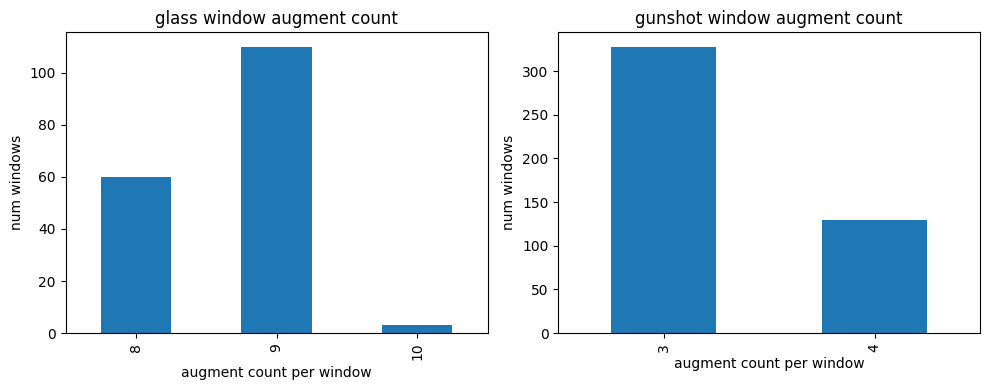

[glass] windows per pipeline x device (counts):


device,band,codec,codec_compress,compress,eq,none,rir
pipeline,,,,,,,
band+filter_gain_shift,15,0,0,0,0,0,0
band+mix_filter_gain_shift,20,0,0,0,0,0,0
band+mix_gain_shift,15,0,0,0,0,0,0
band+reverb_filter_gain_shift,20,0,0,0,0,0,0
band+reverb_gain_shift,15,0,0,0,0,0,0
...,...,...,...,...,...,...,...
rir+stretch_mix_gain_shift,0,0,0,0,0,0,20
stretch_filter_gain_shift,0,0,0,0,0,15,0
stretch_gain_shift,0,0,0,0,0,20,0


[glass] windows per clip (fold split):


fold_id,1,2,3,4,5
clip_id,,,,,
1-20133-A-39,0,0,0,27,0
1-84536-A-39,0,9,0,0,0
1-84704-A-39,0,8,0,0,0
1-84705-A-39,9,0,0,0,0
1-85168-A-39,0,8,0,0,0
...,...,...,...,...,...
glass_shatter-263962,0,0,0,9,0
glass_shatter-363188,0,0,0,8,0
glass_shatter-7-95202,0,0,0,9,0


[glass] per-window augmentation counts (repeat per clip/window):
8      60
9     110
10      3
Name: count, dtype: int64


In [19]:
import math

# Positives augmentation with balanced coverage (per window/pipeline/device, gun by weapon)
# Rebuild from tasks_pos each run to avoid accumulation
aug_records = []
bg_pool = [r for r in ALL_WINS if r['target_label']==BACKGROUND_LABEL] if 'ALL_WINS' in globals() else []

from itertools import cycle

def _pipeline_cycle(pipelines, rng):
    pipelines = list(pipelines)
    rng.shuffle(pipelines)
    return cycle(pipelines)

def _device_cycle(devices, rng):
    devices = list(devices)
    rng.shuffle(devices)
    return cycle(devices)



from collections import defaultdict

def _schedule_balanced(win_pool, plan_names, device_plans, quota):
    """Balanced sampling over windows x (pipeline, device) with gradual cap relaxation."""
    rng = np.random.default_rng(SEED)
    wins = list(win_pool)
    rng.shuffle(wins)
    combos = [(p, d) for p in plan_names for d in device_plans]
    rng.shuffle(combos)
    if quota <= 0 or not wins or not combos:
        return []
    usage = defaultdict(int)
    target = math.ceil(quota / len(wins))
    out = []
    win_idx = 0
    combo_idx = 0
    while len(out) < quota:
        progressed = False
        min_usage = min(usage.values()) if usage else 0
        for _ in range(len(wins)):
            cid, w_idx, w, row, _weapon = wins[win_idx % len(wins)]
            key = (cid, w_idx)
            if usage[key] >= target and min_usage < target:
                win_idx += 1
                continue
            pipeline, device_name = combos[combo_idx % len(combos)]; combo_idx += 1
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)
            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
            aug = run_pipeline(w_dev, pipeline, background=bg)
            pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
            out.append({
                "clip_id": cid,
                "window_id": f"{cid}_w{w_idx}",
                "fold_id": int(row.get("fold_id", -1)),
                "source": row.get("source", ""),
                "original_label": row.get("target_label", ""),
                "target_label": row.get("target_label", ""),
                "pipeline": pipeline_tag,
                "device": device_name,
                "copy": 0,
                "length_sec": len(aug.audio) / TARGET_SR,
                "audio": aug.audio,
            })
            usage[key] += 1
            win_idx += 1
            progressed = True
            if len(out) >= quota:
                break
        if len(out) >= quota:
            break
        if not progressed:
            target += 1  # 放宽 cap
    return out


def _schedule_grouped(win_pool, plan_names, device_plans, quota):
    return _schedule_balanced(win_pool, plan_names, device_plans, quota)


def _schedule_simple(win_pool, plan_names, device_plans, quota):
    return _schedule_balanced(win_pool, plan_names, device_plans, quota)


    while len(out) < quota:
        cid, w_idx, w, row, pipeline, device_name = combos[idx % n]
        w_dev = run_device_pipeline(w, device_name, TARGET_SR)
        bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
        aug = run_pipeline(w_dev, pipeline, background=bg)
        pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
        out.append({
            "clip_id": cid,
            "window_id": f"{cid}_w{w_idx}",
            "fold_id": int(row.get("fold_id", -1)),
            "source": row.get("source", ""),
            "original_label": row.get("target_label", ""),
            "target_label": row.get("target_label", ""),
            "pipeline": pipeline_tag,
            "device": device_name,
            "copy": 0,
            "length_sec": len(aug.audio) / TARGET_SR,
            "audio": aug.audio,
        })
        idx += 1
    return out



PROGRESS_STEP = 200
MAX_PER_WINDOW = None  # no hard cap per window; cover combos first

# 按 task 即时写 base+aug，隔离各折
aug_records = []
for task in tasks_pos:
    lab = task["lab"]; fold = task["fold"]; win_pool = task["win_pool"]
    plan_names = task["plan_names"]
    if not win_pool:
        print(f"[base] fold {fold} lab {lab}: win_pool empty, skip")
        continue
    # base（仅本折本类）
    base_recs = []
    for clip_id, w_idx, w, row, _weapon in win_pool:
        base_recs.append({
            "clip_id": clip_id,
            "window_id": f"{clip_id}_w{w_idx}",
            "fold_id": fold,
            "source": row.get("source",""),
            "original_label": lab,
            "target_label": lab,
            "pipeline": "base",
            "device": "none",
            "copy": 0,
            "length_sec": len(w) / TARGET_SR,
            "audio": w,
        })
    base_cnt = len(base_recs)
    print(f"[base] fold {fold} lab {lab}: base_written={base_cnt}")

    # 增广（只看本折本类）
    current_base = base_cnt
    remaining = max(TARGET_PER_FOLD[lab] - current_base, 0)
    if remaining <= 0 or not plan_names:
        aug_list = []
        if remaining <= 0:
            print(f"[info] fold {fold} lab {lab}: remaining=0 or no plan, base={current_base}")
    else:
        if lab == "gunshot":
            aug_list = _schedule_grouped(win_pool, plan_names, DEVICE_PLANS, remaining)
        else:
            aug_list = _schedule_simple(win_pool, plan_names, DEVICE_PLANS, remaining)
    # 强制纠正 fold_id 为当前 fold，避免旧 fold_id 污染
    for r in aug_list:
        r["fold_id"] = fold
    total_now = current_base + len(aug_list)
    print(f"[done] fold {fold} lab {lab}: base={current_base}, aug_added={len(aug_list)}, total_now={total_now}, target={TARGET_PER_FOLD[lab]}, remaining_after={max(TARGET_PER_FOLD[lab]-total_now,0)}")

    # 写入全局
    aug_records.extend(base_recs)
    aug_records.extend(aug_list)

aug_df = pd.DataFrame(aug_records)
display(aug_df[:5])

print("Windows per fold x target_label x pipeline (with totals):")
pivot = aug_df.pivot_table(
    index="fold_id",
    columns=["target_label", "pipeline"],
    values="window_id",
    aggfunc="count"
).fillna(0).astype(int)
pivot["total"] = pivot.sum(axis=1)
total_row = pivot.sum(axis=0).to_frame().T; total_row.index = ["total"]
pivot_with_totals = pd.concat([pivot, total_row])
print(pivot_with_totals.T.to_string())

# weapon 映射与统计
gun_aug = aug_df[aug_df["target_label"] == "gunshot"].copy()
if not gun_aug.empty:
    weapon_map = {
        Path(row["filepath"]).stem: parse_weapon(row.get("extra_meta", ""))
        for _, row in folded_df[folded_df["canonical_label"] == "gunshot"].iterrows()
    }
    gun_aug["weapon"] = gun_aug.apply(
        lambda r: weapon_map.get(r["clip_id"], "unknown"), axis=1,
    )
    print("Weapon x fold (augmented windows, counts):")
    weapon_fold_win = gun_aug.pivot_table(
        index="weapon",
        columns="fold_id",
        values="window_id",
        aggfunc="count",
        fill_value=0
    ).astype(int)
    display(weapon_fold_win)

print("Device x fold (positives, counts):")
pivot_dev = aug_df.pivot_table(
    index="device",
    columns="fold_id",
    values="window_id",
    aggfunc="count",
    fill_value=0
).astype(int)
display(pivot_dev)

# Per-window augmentation counts histogram
import matplotlib.pyplot as plt
hist_data = {}
for cls in ['glass','gunshot']:
    cls_augs = aug_df[aug_df['target_label']==cls]
    counts = cls_augs.groupby(['clip_id','window_id']).size()
    hist_data[cls] = counts.value_counts().sort_index()
if 'bg_df' in globals():
    bg_counts = bg_df.groupby(['clip_id','window_id']).size()
    hist_data['background'] = bg_counts.value_counts().sort_index()
fig, axes = plt.subplots(1, len(hist_data), figsize=(5*len(hist_data),4))
if len(hist_data)==1:
    axes=[axes]
for ax,(cls,hist) in zip(axes, hist_data.items()):
    hist.plot(kind='bar', ax=ax)
    ax.set_title(f'{cls} window augment count')
    ax.set_xlabel('augment count per window')
    ax.set_ylabel('num windows')
plt.tight_layout(); plt.show()



## 均匀抽样选出 background window

In [20]:
plan_names = list(PIPELINE_REGISTRY.keys())
rng = np.random.default_rng(SEED)
bg_aug_records = []

SILENT_PER_FOLD = 20
SILENT_DB_RANGE = (-45.0, -35.0)
SILENT_PIPELINE = "silent_atten"

def _rms(y):
    return float(np.sqrt(np.mean(y**2) + 1e-12))

def _scale_to_db(y, target_db):
    cur = _rms(y)
    if cur <= 1e-9:
        return y.astype(np.float32, copy=False)
    target = 10 ** (target_db / 20.0)
    scale = target / cur
    return (y * scale).astype(np.float32, copy=False)
    

In [21]:
bg_aug_records = []
# Background tasks using ALL_WINS (no re-windowing)
ensure_all_wins()
tasks_bg = []  # 保存每折的 win_pool、silent_count、remaining_target 等
if not ALL_WINS:
    print('ALL_WINS empty; skip background tasks')
else:
    rng = np.random.default_rng(SEED)
    bg_pool = [r for r in ALL_WINS if r['target_label'] == BACKGROUND_LABEL]
    by_fold = {}
    for rec in bg_pool:
        by_fold.setdefault(rec['fold_id'], []).append(rec)

    for fold, recs in by_fold.items():
        win_by_label = {}
        for rec in recs:
            lab = rec.get('orig_label', BACKGROUND_LABEL)
            win_by_label.setdefault(lab, []).append((rec['clip_id'], int(rec['window_id'].lstrip('w')), rec['audio'], rec['row'], lab))
        if not win_by_label:
            continue
        for lab in win_by_label:
            rng.shuffle(win_by_label[lab])
        labels = sorted(win_by_label.keys()); n_labels = len(labels)

        # 1) silent 配额
        silent_count = 0
        while silent_count < SILENT_PER_FOLD:
            progressed = False
            for lab in labels:
                if silent_count >= SILENT_PER_FOLD:
                    break
                pool = win_by_label[lab]
                if not pool:
                    continue
                clip_id, w_idx, w, row, orig_label = pool[0]
                win_by_label[lab] = pool[1:]
                y_silent = _scale_to_db(w, rng.uniform(*SILENT_DB_RANGE))
                bg_aug_records.append({
                    'clip_id': clip_id,
                    'window_id': f"{clip_id}_w{w_idx}_silent_{silent_count}",
                    'fold_id': fold,
                    'source': row.get('source',''),
                    'original_label': 'silent',
                    'target_label': BACKGROUND_LABEL,
                    'pipeline': SILENT_PIPELINE,
                    'copy': 0,
                    'length_sec': len(y_silent)/TARGET_SR,
                    'audio': y_silent,
                    'filepath': row.get('filepath', row.get('raw_filepath', '')),
                    'raw_filepath': row.get('raw_filepath', row.get('filepath', '')),
                })
                silent_count += 1; progressed = True
            if not progressed:
                break

        remaining_target = max(0, TARGET_BG_PER_FOLD - silent_count)
        base_quota = remaining_target // n_labels if n_labels > 0 else 0
        remainder = remaining_target % n_labels if n_labels > 0 else 0
        count = 0

        # 基准 base 分配
        for lab in labels:
            pool = win_by_label[lab]
            take_n = min(base_quota, len(pool))
            for i in range(take_n):
                clip_id, w_idx, w, row, orig_label = pool[i]
                bg_aug_records.append({
                    'clip_id': clip_id,
                    'window_id': f"{clip_id}_w{w_idx}",
                    'fold_id': fold,
                    'source': row.get('source',''),
                    'original_label': orig_label,
                    'target_label': BACKGROUND_LABEL,
                    'pipeline': 'base',
                    'copy': 0,
                    'length_sec': len(w)/TARGET_SR,
                    'audio': w,
                })
                count += 1
            win_by_label[lab] = pool[take_n:]

        tasks_bg.append({
            "fold": fold,
            "win_by_label": win_by_label,
            "labels": labels,
            "remainder": remainder,
            "count": count,
            "remaining_target": remaining_target,
            "device_plans": DEVICE_PLANS,
        })

    summary_bg = []
    for t in tasks_bg:
        summary_bg.append({
            "fold": t["fold"],
            "labels": t["labels"],
            "n_labels": len(t["labels"]),
            "win_total": sum(len(v) for v in t["win_by_label"].values()),
            "remaining_target": t["remaining_target"],
            "count_base": t["count"],
            "remainder": t["remainder"],
        })
    display(pd.DataFrame(summary_bg))





,fold,labels,n_labels,win_total,remaining_target,count_base,remainder
0,1,"[airplane, breathing, brushing_teeth, can_open...",60,1500,480,431,0
1,2,"[airplane, breathing, brushing_teeth, can_open...",58,1507,480,420,16
2,3,"[airplane, breathing, brushing_teeth, can_open...",57,1447,480,415,24
3,4,"[airplane, breathing, brushing_teeth, can_open...",57,1542,480,416,24
4,5,"[airplane, breathing, brushing_teeth, can_open...",57,1580,480,414,24


In [22]:
# Background augmentation with balanced coverage (label x window x pipeline)
PROGRESS_STEP = 200
MAX_BG_PER_WINDOW = 10**9
# Preserve previously written silent/base records
bg_aug_records = list(globals().get('bg_aug_records', []))

from itertools import cycle

def _schedule_bg(win_by_label, pipelines, device_plans, quota_per_fold, max_per_window):
    rng = np.random.default_rng(SEED)
    counts = {}
    items = []
    for lab, pool in win_by_label.items():
        rng.shuffle(pool)
        for item in pool:
            cid, w_idx, w, row, orig_label = item
            key = (cid, w_idx)
            counts[key] = 0
            items.append((lab, cid, w_idx, w, row, orig_label))
    if not items or quota_per_fold <= 0:
        return []
    pipelines = list(pipelines)
    rng.shuffle(pipelines)
    pipe_c = cycle(pipelines)
    devices = list(device_plans)
    rng.shuffle(devices)
    dev_c = cycle(devices)
    out = []
    round_idx = 0
    while len(out) < quota_per_fold and round_idx < max_per_window:
        progressed = False
        labels = sorted({lab for lab, *_ in items})
        for lab in labels:
            lab_items = [x for x in items if x[0] == lab]
            if not lab_items:
                continue
            item = lab_items[round_idx % len(lab_items)]
            _, cid, w_idx, w, row, orig_label = item
            key = (cid, w_idx)
            if counts.get(key, 0) >= max_per_window:
                pass
            pipeline = next(pipe_c)
            device_name = next(dev_c)
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)
            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[pipeline] else None
            aug = run_pipeline(w_dev, pipeline, background=bg)
            pipeline_tag = pipeline if device_name == "none" else f"{device_name}+{pipeline}"
            out.append({
                'clip_id': cid,
                'window_id': f"{cid}_w{w_idx}",
                'fold_id': int(row.get('fold_id', -1)),
                'source': row.get('source',''),
                'original_label': orig_label,
                'target_label': BACKGROUND_LABEL,
                'pipeline': pipeline_tag,
                'copy': 0,
                'length_sec': len(aug.audio)/TARGET_SR,
                'audio': aug.audio,
            })
            counts[key] = counts.get(key, 0) + 1
            progressed = True
            if len(out) >= quota_per_fold:
                break
        if not progressed:
            break
        round_idx += 1
    return out

for task in tasks_bg:
    fold = task["fold"]
    win_by_label = task["win_by_label"]
    labels = task["labels"]
    remainder = task["remainder"]
    remaining_target = task["remaining_target"]
    count_base = task.get("count", 0)

    # remaining_target 是 silent 后的剩余配额；扣除 base 后才是增强目标
    aug_target = max(remaining_target - count_base, 0)
    if aug_target <= 0:
        print(f"[info] fold {fold} bg: remaining=0")
        continue

    max_aug_quota = aug_target
    plan_names = list(PIPELINE_REGISTRY.keys())
    aug_list = _schedule_bg(win_by_label, plan_names, DEVICE_PLANS, max_aug_quota, MAX_BG_PER_WINDOW)
    bg_aug_records.extend(aug_list)
    print(f"[done] fold {fold} bg: base+silent={count_base}, aug_added={len(aug_list)} / target {max_aug_quota}")

bg_df = pd.DataFrame(bg_aug_records)
print("Background windows per fold x orig_label x pipeline (with totals):")
pivot_bg = bg_df.pivot_table(
    index="fold_id",
    columns=["original_label", "pipeline"],
    values="window_id",
    aggfunc="count",
    fill_value=0,
).astype(int)
pivot_bg["total"] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T; total_row.index = ["total"]
pivot_bg_with_totals = pd.concat([pivot_bg, total_row])
print(pivot_bg_with_totals.T.to_string())





[done] fold 1 bg: base+silent=431, aug_added=49 / target 49
[done] fold 2 bg: base+silent=420, aug_added=60 / target 60
[done] fold 3 bg: base+silent=415, aug_added=65 / target 65
[done] fold 4 bg: base+silent=416, aug_added=64 / target 64
[done] fold 5 bg: base+silent=414, aug_added=66 / target 66
Background windows per fold x orig_label x pipeline (with totals):
                                                                 1    2    3    4    5  total
original_label   pipeline                                                                    
airplane         band+reverb_mix_gain_shift                      1    0    0    0    0      1
                 base                                            8    8    8    8    8     40
                 codec+mix_gain_shift                            0    0    0    1    0      1
                 codec+reverb_filter_gain_shift                  0    0    0    0    1      1
                 codec+stretch_mix_gain_shift                    0   

## 整合最终用于训练的 window 数据

In [23]:
# 合并正类窗口（aug_df）与背景窗口
# display(bg_df[:5])
# display(aug_df[:5])

all_windows_df = pd.concat([aug_df, bg_df], ignore_index=True, sort=False)
print(f"Total windows combined: {len(all_windows_df)}")
print("By target_label:")
for lbl, cnt in all_windows_df['target_label'].value_counts().sort_index().items():
    print(f"  {lbl}: {cnt}")
display(all_windows_df[:5])

# 如需背景的折×pipeline×原始类汇总（带总计）
pivot_bg = all_windows_df.pivot_table(
    index='fold_id',
    columns=['pipeline', 'original_label'],
    values='window_id',
    aggfunc='count'
).fillna(0).astype(int)
pivot_bg['total'] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T
total_row.index = ['total']
pivot_bg_tot = pd.concat([pivot_bg, total_row])
print("\nBackground windows per fold x pipeline x orig_label (with totals):")
print(pivot_bg_tot.T.to_string())


Total windows combined: 5500
By target_label:
  background: 2500
  glass: 1500
  gunshot: 1500


,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,device,copy,length_sec,audio,filepath,raw_filepath
0,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00061035156, 0.00030517578, 0.0, 0.0001831...",NaN,NaN
1,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00018310547, -0.00018310547, 0.00033569336...",NaN,NaN
2,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.5987854, -0.59402466, 0.23687744, -0.01562...",NaN,NaN
3,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NaN,NaN
4,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,1,sound_extra,glass,glass,base,none,0,1.0,"[-0.00012207031, -3.0517578e-05, 0.00036621094...",NaN,NaN



Background windows per fold x pipeline x orig_label (with totals):
                                                                  1     2     3     4     5  total
pipeline                                     original_label                                       
band+filter_gain_shift                       chirping_birds       0     0     0     1     0      1
                                             clapping             0     0     1     0     0      1
                                             door_wood_creaks     0     1     0     0     0      1
                                             door_wood_knock      1     0     0     0     0      1
                                             glass                3     3     3     3     3     15
                                             gunshot              2     3     3     3     3     14
                                             rooster              0     0     0     0     1      1
band+mix_filter_gain_shift               

## Listen: base vs aug (smoke) / 试听增强样本
抽样 glass/gunshot 各 1 条，播放 base 和各 pipeline 增强（mix 会抽背景）。


In [24]:
# QA 试听：抽每类 1 窗，播放 base / device-only / device+event 基于 ALL_WINS（保留原结构）
SMOKE_LISTEN = True
DEVICE_LIST = list(DEVICE_PLANS)
EVENT_LIST = list(PIPELINE_REGISTRY.keys())
MAX_DEV = 5   # 最多试听的 device 数
MAX_EVT = 6   # 最多试听的 event 数

rng = np.random.default_rng(SEED)
ensure_all_wins()

if SMOKE_LISTEN and ALL_WINS:
    device_subset = DEVICE_LIST if len(DEVICE_LIST) <= MAX_DEV else list(rng.choice(DEVICE_LIST, MAX_DEV, replace=False))
    event_subset = EVENT_LIST if len(EVENT_LIST) <= MAX_EVT else list(rng.choice(EVENT_LIST, MAX_EVT, replace=False))
    for lbl in TARGET_LABELS:
        pool = [r for r in ALL_WINS if r['target_label']==lbl]
        if not pool:
            continue
        rec = pool[rng.integers(len(pool))]
        base = rec['audio']
        clip_id = rec['clip_id']
        print(f"[QA] Label={lbl} | clip={clip_id} | base")
        display(Audio(base, rate=TARGET_SR))
        for dev in device_subset:
            y_dev = run_device_pipeline(base, dev, TARGET_SR)
            info = f"dev={dev} | len={len(y_dev)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_dev)):.3f}"
            print("  ", info)
            display(Audio(y_dev, rate=TARGET_SR))
        for dev in device_subset:
            for evt in event_subset:
                y_dev = run_device_pipeline(base, dev, TARGET_SR)
                bg = sample_bg_chunk(len(y_dev)) if 'mix' in PIPELINE_REGISTRY.get(evt, ()) else None
                aug = run_pipeline(y_dev, evt, background=bg)
                y_out = aug.audio
                info = f"dev={dev} evt={evt} | len={len(y_out)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_out)):.3f}"
                print("  ", info)
                display(Audio(y_out, rate=TARGET_SR))
        print('-' * 60)
elif SMOKE_LISTEN:
    print('No windows for QA listen')



[QA] Label=glass | clip=glass_glass-shatter-3-100155 | base


   dev=rir | len=1.00s | absmax=1.000


   dev=band | len=1.00s | absmax=1.024


   dev=codec | len=1.00s | absmax=1.060


   dev=none | len=1.00s | absmax=1.000


   dev=codec_compress | len=1.00s | absmax=1.010


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=0.867


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=1.070


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.067


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=0.675


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=1.098


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.669


   dev=band evt=filter_gain_shift | len=1.00s | absmax=1.005


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=0.895


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.019


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=0.223


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=1.173


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.378


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=1.042


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=0.971


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.107


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=0.666


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=1.056


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.716


   dev=none evt=filter_gain_shift | len=1.00s | absmax=0.969


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=2.130


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.037


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=0.608


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=0.869


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.005


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=1.033


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=0.372


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.015


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=1.012


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=1.030


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.405


------------------------------------------------------------
[QA] Label=gunshot | clip=8 (49) | base


   dev=rir | len=1.00s | absmax=0.353


   dev=band | len=1.00s | absmax=0.371


   dev=codec | len=1.00s | absmax=0.379


   dev=none | len=1.00s | absmax=0.361


   dev=codec_compress | len=1.00s | absmax=0.505


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=0.394


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=0.373


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.559


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=0.325


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=0.474


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.836


   dev=band evt=filter_gain_shift | len=1.00s | absmax=0.557


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=0.277


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.496


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=0.343


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=0.397


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.255


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=0.297


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=0.374


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.394


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=0.340


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=0.479


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.303


   dev=none evt=filter_gain_shift | len=1.00s | absmax=0.349


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=0.290


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.624


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=0.397


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=0.555


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.438


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=0.543


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=0.484


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.636


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=0.593


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=0.811


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.790


------------------------------------------------------------


## 训练 window 展示

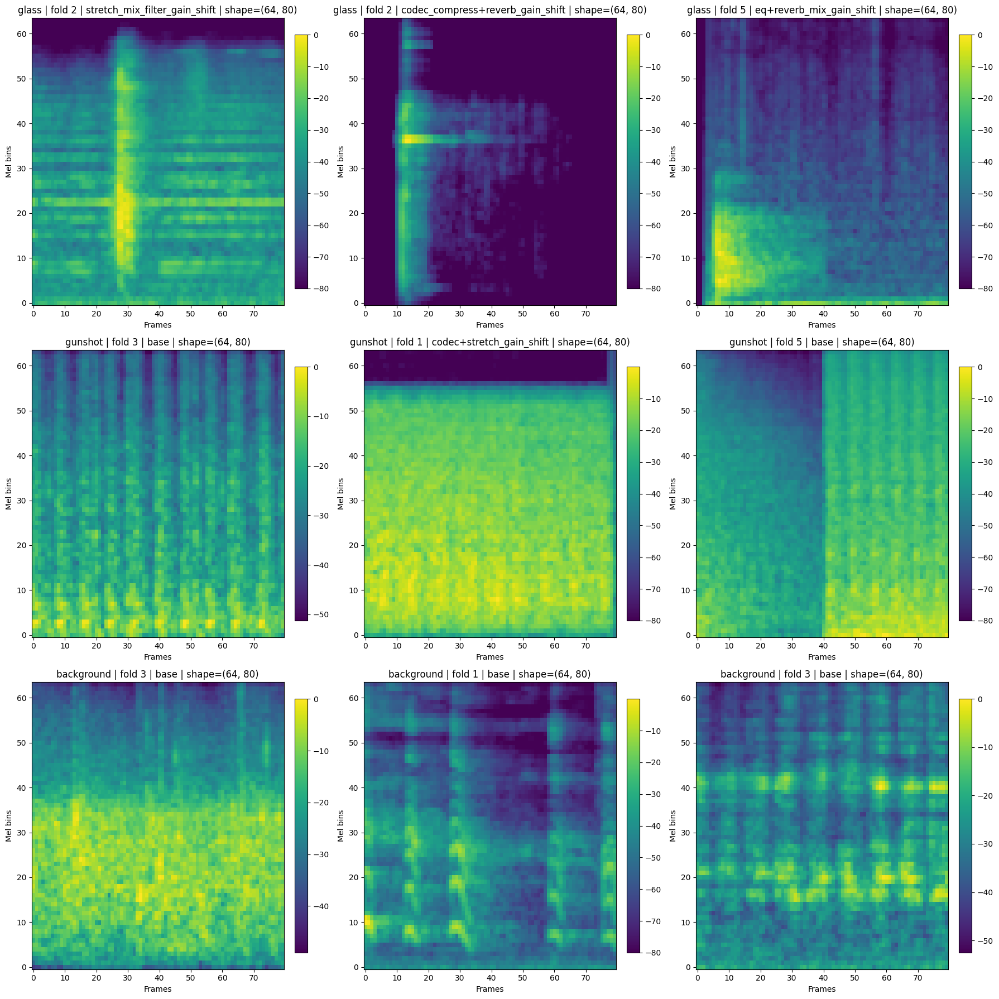

In [25]:
samples_per_label = 3
labels = ['glass', 'gunshot', BACKGROUND_LABEL]
rows = []
rng = np.random.default_rng(SEED)

for lbl in labels:
    subset = all_windows_df[all_windows_df['target_label'] == lbl]
    if subset.empty:
        continue
    # 有放回抽样，确保凑够 samples_per_label
    picks = subset.sample(n=samples_per_label, replace=len(subset) < samples_per_label, random_state=None)
    rows.extend(picks.to_dict('records'))

if not rows:
    print("No samples available for plotting.")
else:
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()
    for idx, row in enumerate(rows[:9]):  # 防止不足 9 条
        y, sr = resolve_audio_from_row(row, sr=TARGET_SR)
        mel = log_mel_spectrogram(y, sr)
        if TARGET_FRAMES is not None:
            if mel.shape[1] > TARGET_FRAMES:
                mel = mel[:, :TARGET_FRAMES]
            elif mel.shape[1] < TARGET_FRAMES:
                pad = TARGET_FRAMES - mel.shape[1]
                mel = np.pad(mel, ((0, 0), (0, pad)), mode="constant")
        ax = axes[idx]
        im = ax.imshow(mel, origin='lower', aspect='auto')
        ax.set_title(
            f"{row.get('target_label','?')} | fold {row.get('fold_id','?')} | {row.get('pipeline','base')} | shape={mel.shape}"
        )
        ax.set_xlabel('Frames')
        ax.set_ylabel('Mel bins')
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # 处理空格子
    for j in range(len(rows), 9):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()


## 缓存训练 window 的 mel-log 图谱，以及输出训练目录

In [26]:
# Cache mel features + export training index (API)

cache_dir = CACHE_MEL64
index_csv = PROJECT_ROOT / 'cache' / 'window_index.csv'

index_df = cache_windows_to_mel_index(
    all_windows_df,
    cache_dir=cache_dir,
    index_csv=index_csv,
    target_sr=TARGET_SR,
    target_frames=TARGET_FRAMES,
)

print(f"Saved {len(index_df)} windows to {cache_dir}")
print(f"Index CSV: {index_csv}")
display(index_df.head())

# Quick sanity: label_ids combos (parse CSV-friendly strings)
import ast

def _to_tuple(v):
    if isinstance(v, str):
        try:
            v = ast.literal_eval(v)
        except Exception:
            return tuple()
    if v is None:
        return tuple()
    return tuple(v)

unique_combos = sorted({_to_tuple(v) for v in index_df['label_ids'].tolist()})
print('Unique label_ids combos:', unique_combos)
print('Label counts:')
print(index_df['label'].value_counts().to_string())


Saved 5500 windows to /workspace/cache/mel64
Index CSV: /workspace/cache/window_index.csv


,path,target_label,label,labels,label_ids,fold_id,pipeline,clip_id,window_id,source,shape,orig_label,length_sec
0,cache/mel64/glass/fold1/glass_breaking-glass-2...,glass,glass,[glass],[0],1,base,glass_breaking-glass-2-86555,glass_breaking-glass-2-86555_w0,sound_extra,"(64, 80)",glass,1.0
1,cache/mel64/glass/fold1/glass_shattering-chand...,glass,glass,[glass],[0],1,base,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w0,sound_extra,"(64, 80)",glass,1.0
2,cache/mel64/glass/fold1/glass_shattering-chand...,glass,glass,[glass],[0],1,base,glass_shattering-chandelier-38391,glass_shattering-chandelier-38391_w1,sound_extra,"(64, 80)",glass,1.0
3,cache/mel64/glass/fold1/glass_breaking-glass-8...,glass,glass,[glass],[0],1,base,glass_breaking-glass-88411,glass_breaking-glass-88411_w0,sound_extra,"(64, 80)",glass,1.0
4,cache/mel64/glass/fold1/glass_541601__matt_rat...,glass,glass,[glass],[0],1,base,glass_541601__matt_ratz__shattering-chandelier,glass_541601__matt_ratz__shattering-chandelier_w0,sound_extra,"(64, 80)",glass,1.0


Unique label_ids combos: [(), (0,), (1,)]
Label counts:
label
background    2500
glass         1500
gunshot       1500


In [27]:
# Cell: Export mel visualizations (per-fold & per-label sampling, excluding background)
viz_dir = PROJECT_ROOT / "cache" / "mel64_viz"
viz_dir.mkdir(parents=True, exist_ok=True)

# 采样比例：1.0=100%全量；0.2=20%
VIZ_SAMPLE_RATIO = 0.2 

if index_df is None or index_df.empty:
    print("index_df is empty; skip mel visualization")
else:
    viz_df = index_df[index_df["label"] != BACKGROUND_LABEL].copy()
    if viz_df.empty:
        print("No non-background samples for visualization")
    else:
        total_saved = 0
        total_groups = viz_df.groupby(["label", "fold_id"]).ngroups
        print(f"Groups to process: {total_groups}")

        for (label, fold_id), grp in viz_df.groupby(["label", "fold_id"]):
            if grp.empty:
                continue
            n = int(len(grp) * VIZ_SAMPLE_RATIO)
            if VIZ_SAMPLE_RATIO > 0 and n < 1:
                n = 1
            n = min(n, len(grp))
            sample = grp.sample(n=n, random_state=SEED)

            out_dir = viz_dir / str(label) / f"fold{fold_id}"
            out_dir.mkdir(parents=True, exist_ok=True)

            print(f"[{label} | fold {fold_id}] {len(grp)} rows -> saving {n} mels...")
            saved = 0
            for _, row in sample.iterrows():
                mel_path = Path(row["path"])
                if not mel_path.is_absolute():
                    mel_path = PROJECT_ROOT / mel_path
                mel = np.load(mel_path)

                out_path = out_dir / f"{mel_path.stem}.png"
                fig, ax = plt.subplots(figsize=(4, 3))
                im = ax.imshow(mel, origin="lower", aspect="auto")
                ax.set_title(f"{label} | fold {fold_id}")
                ax.set_xlabel("Frames")
                ax.set_ylabel("Mel bins")
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                fig.tight_layout()
                fig.savefig(out_path, dpi=120)
                plt.close(fig)
                saved += 1
                total_saved += 1

            print(f"  saved {saved} -> {out_dir}")

        print(f"Mel visualizations saved: {total_saved} images under {viz_dir}")


Groups to process: 10
[glass | fold 1] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/glass/fold1
[glass | fold 2] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/glass/fold2
[glass | fold 3] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/glass/fold3
[glass | fold 4] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/glass/fold4
[glass | fold 5] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/glass/fold5
[gunshot | fold 1] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/gunshot/fold1
[gunshot | fold 2] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/gunshot/fold2
[gunshot | fold 3] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/gunshot/fold3
[gunshot | fold 4] 300 rows -> saving 60 mels...
  saved 60 -> /workspace/cache/mel64_viz/gunshot/fold4
[gunshot | fold 5] 300 rows -> saving 60 mels...
  saved 60 ->

## Regression Summary / 回归自检
这个单元不加载音频，只汇总关键表的规模/分布，方便每次改动后快速确认没有跑偏。


In [28]:
from collections import OrderedDict
import ast

def _maybe(name):
    return globals().get(name)

def _df_info(df, name):
    if df is None:
        return
    print(f"\n[{name}] rows={len(df)} cols={list(df.columns)}")

resampled_df = _maybe('resampled_df')
folded_df = _maybe('folded_df')
window_df = _maybe('window_df')
aug_df = _maybe('aug_df')
bg_df = _maybe('bg_df')
all_windows_df = _maybe('all_windows_df')
index_df = _maybe('index_df')

for name, df in [
    ('resampled_df', resampled_df),
    ('folded_df', folded_df),
    ('window_df', window_df),
    ('aug_df', aug_df),
    ('bg_df', bg_df),
    ('all_windows_df', all_windows_df),
    ('index_df', index_df),
]:
    _df_info(df, name)

if folded_df is not None and 'fold_id' in folded_df.columns and 'target_label' in folded_df.columns:
    print('\nFold x target_label (clip-level counts):')
    pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if all_windows_df is not None and 'fold_id' in all_windows_df.columns and 'target_label' in all_windows_df.columns:
    print('\nFold x target_label (window-level counts):')
    pivot = all_windows_df.pivot_table(index='target_label', columns='fold_id', values='window_id', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if index_df is not None and 'path' in index_df.columns:
    # Inspect mel shape quickly by sampling one npy
    try:
        sample_path = Path(index_df['path'].iloc[0])
        if not sample_path.is_absolute():
            sample_path = PROJECT_ROOT / sample_path
        mel = np.load(sample_path)
        print(f"\nSample mel: {sample_path} shape={mel.shape} dtype={mel.dtype}")
    except Exception as e:
        print('\nSample mel check failed:', e)

    # label_ids combos
    if 'label_ids' in index_df.columns:
        def _parse_ids(v):
            if isinstance(v, str):
                try:
                    v = ast.literal_eval(v)
                except Exception:
                    return tuple()
            if v is None:
                return tuple()
            return tuple(v)
        combos = sorted({_parse_ids(v) for v in index_df['label_ids'].tolist()})
        print('\nUnique label_ids combos:', combos)



[resampled_df] rows=2471 cols=['sno', 'raw_filepath', 'filepath', 'label', 'canonical_label', 'source', 'fold_id', 'duration_sec', 'duration_samples', 'sr', 'channels', 'bit_depth', 'md5', 'extra_meta', 'target_label']

[folded_df] rows=2471 cols=['sno', 'raw_filepath', 'filepath', 'label', 'canonical_label', 'source', 'fold_id', 'duration_sec', 'duration_samples', 'sr', 'channels', 'bit_depth', 'md5', 'extra_meta', 'target_label']

[window_df] rows=10402 cols=['clip_id', 'window_id', 'fold_id', 'source', 'orig_label', 'target_label', 'start_sec', 'end_sec', 'length_sec', 'filepath', 'raw_filepath']

[aug_df] rows=3000 cols=['clip_id', 'window_id', 'fold_id', 'source', 'original_label', 'target_label', 'pipeline', 'device', 'copy', 'length_sec', 'audio']

[bg_df] rows=2500 cols=['clip_id', 'window_id', 'fold_id', 'source', 'original_label', 'target_label', 'pipeline', 'copy', 'length_sec', 'audio', 'filepath', 'raw_filepath']

[all_windows_df] rows=5500 cols=['clip_id', 'window_id', '

In [29]:
# # Glass coverage + optional rebalance (clip-level move to balance folds)
# import pandas as pd
# from pathlib import Path
# from src.folds import rebalance_folds_by_windows

# REBALANCE_GLASS = True  # set False to only report
# TOL_RATIO = 0.05

# clips = folded_df[folded_df['canonical_label']=='glass'] if 'folded_df' in globals() else pd.DataFrame()
# print(f"Glass clips in folded_df: {len(clips)}")
# clip_ids = set(Path(str(p)).stem for p in clips['filepath']) if not clips.empty else set()
# print(f"Unique glass clip_id stems: {len(clip_ids)}")

# if 'window_df' not in globals():
#     print('window_df not found; skip rebalance')
# else:
#     glass_win = window_df[window_df['target_label']=='glass']
#     print(f"Glass windows in window_df: {len(glass_win)}")
#     print("Before rebalance (per fold):")
#     print(glass_win.groupby('fold_id').size())

#     if REBALANCE_GLASS:
#         glass_balanced, moves = rebalance_folds_by_windows(
#             glass_win,
#             label_col='target_label',
#             preserve_label_presence=True,
#             tolerance_ratio=TOL_RATIO,
#         )
#         if moves:
#             print(f"Rebalanced glass (moved {len(moves)} clips):")
#             for m in moves:
#                 print(f"clip {m['clip_id']} : fold {m['from']} -> {m['to']} | windows={m['n_windows']}")
#             move_map = {m['clip_id']: m['to'] for m in moves}
#             window_df.loc[window_df['target_label']=='glass', 'fold_id'] = window_df.apply(
#                 lambda r: move_map.get(r['clip_id'], r['fold_id']), axis=1
#             )
#             if 'folded_df' in globals():
#                 folded_df.loc[folded_df['canonical_label']=='glass', 'fold_id'] = folded_df.apply(
#                     lambda r: move_map.get(Path(str(r['filepath'])).stem, r['fold_id']), axis=1
#                 )
#             print("After rebalance (per fold):")
#             print(window_df[window_df['target_label']=='glass'].groupby('fold_id').size())
#         else:
#             print("No glass rebalance performed (within tolerance).")
